#this is the part of code which clones the github repo of GroundingDino

In [ ]:
!git clone https://github.com/IDEA-Research/Grounded-Segment-Anything
!mv Grounded-Segment-Anything/* .
!rm -R Grounded-Segment-Anything/
!pip install -q -r requirements.txt
%cd /content/GroundingDINO
!pip install -q .
%cd /content/segment_anything
!pip install -q .
%cd /content
!pip install accelerate

Cloning into 'Grounded-Segment-Anything'...
remote: Enumerating objects: 1807, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 1807 (delta 11), reused 24 (delta 1), pack-reused 1766 (from 1)
Receiving objects: 100% (1807/1807), 155.84 MiB | 12.66 MiB/s, done.
Resolving deltas: 100% (832/832), done.
Updating files: 100% (247/247), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 8.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 66.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━

# we have used different pre-trained diffusion models and setteled with stabilityai/stable-diffusion-2-1 which gave good images with comparitively faster image generations.

In [ ]:
from diffusers import DiffusionPipeline
import torch
import numpy as np
from PIL import Image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
sd_pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1",
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

prompts or image titles used by GroundingDino to generate images which are generated by chatgpt.

we are generating traffic sign detection which has 15 classes in it .
'Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop'

In [ ]:
chatgpt_response = [
    'A green light on a traffic signal , photo, 4k, high resolution',
    'A red light on a traffic signal, photo, 4k, high resolution',
    'Stop traffic sign, photo, 4k, high resolution'
]


#this is the part of code which generates the images.

In [ ]:
import os
import numpy as np
from PIL import Image

# Define the directory to save images
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

negative_prompt = "low resolution, ugly, naked, nude"
num_batches = len(chatgpt_response)
num_images_per_batch = 15

generated_images = []
for i in range(num_batches):
    batch = sd_pipe(
        prompt=chatgpt_response[i],
        negative_prompt=negative_prompt,
        num_images_per_prompt=num_images_per_batch,
        height=640,
        width=640
    )

    # Process each image in the batch
    for j, batch_image in enumerate(batch.images):
        image_array = np.array(batch_image)
        generated_images.append(image_array)

        # Save the image to a file
        image = Image.fromarray(image_array)
        image_file_path = os.path.join(output_dir, f"batch_{i}_image_{j}.png")
        image.save(image_file_path)
        print(f"Saved: {image_file_path}")


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_0_image_0.png
Saved: generated_images/batch_0_image_1.png
Saved: generated_images/batch_0_image_2.png
Saved: generated_images/batch_0_image_3.png
Saved: generated_images/batch_0_image_4.png
Saved: generated_images/batch_0_image_5.png
Saved: generated_images/batch_0_image_6.png
Saved: generated_images/batch_0_image_7.png
Saved: generated_images/batch_0_image_8.png
Saved: generated_images/batch_0_image_9.png
Saved: generated_images/batch_0_image_10.png
Saved: generated_images/batch_0_image_11.png
Saved: generated_images/batch_0_image_12.png
Saved: generated_images/batch_0_image_13.png
Saved: generated_images/batch_0_image_14.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_1_image_0.png
Saved: generated_images/batch_1_image_1.png
Saved: generated_images/batch_1_image_2.png
Saved: generated_images/batch_1_image_3.png
Saved: generated_images/batch_1_image_4.png
Saved: generated_images/batch_1_image_5.png
Saved: generated_images/batch_1_image_6.png
Saved: generated_images/batch_1_image_7.png
Saved: generated_images/batch_1_image_8.png
Saved: generated_images/batch_1_image_9.png
Saved: generated_images/batch_1_image_10.png
Saved: generated_images/batch_1_image_11.png
Saved: generated_images/batch_1_image_12.png
Saved: generated_images/batch_1_image_13.png
Saved: generated_images/batch_1_image_14.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: generated_images/batch_2_image_0.png
Saved: generated_images/batch_2_image_1.png
Saved: generated_images/batch_2_image_2.png
Saved: generated_images/batch_2_image_3.png
Saved: generated_images/batch_2_image_4.png
Saved: generated_images/batch_2_image_5.png
Saved: generated_images/batch_2_image_6.png
Saved: generated_images/batch_2_image_7.png
Saved: generated_images/batch_2_image_8.png
Saved: generated_images/batch_2_image_9.png
Saved: generated_images/batch_2_image_10.png
Saved: generated_images/batch_2_image_11.png
Saved: generated_images/batch_2_image_12.png
Saved: generated_images/batch_2_image_13.png
Saved: generated_images/batch_2_image_14.png


#visualizing the generated images.

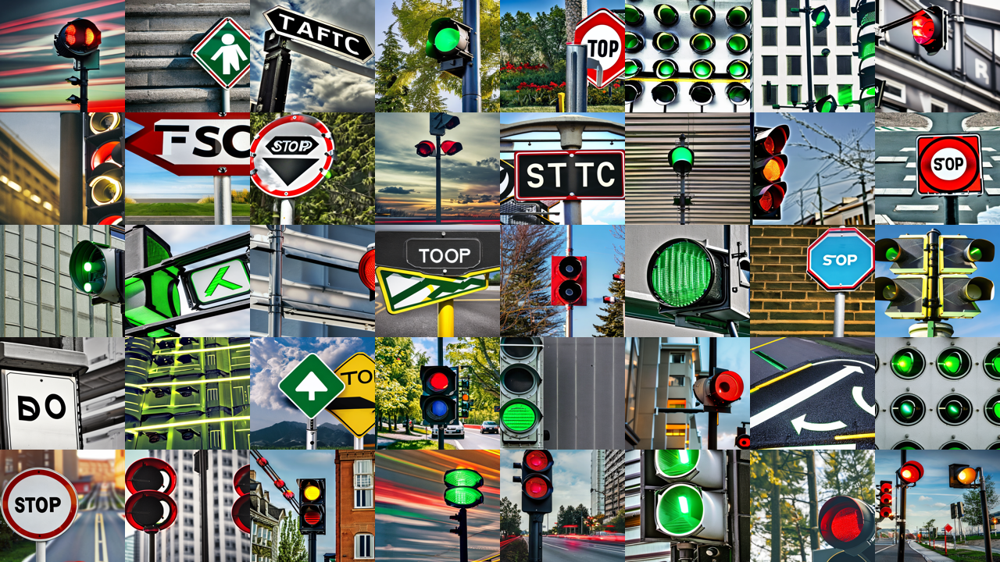

In [ ]:
def mosaic_sample(list_of_arrays, nrows=5, ncols=8):
    random_choose = np.arange(0,len(list_of_arrays), 1)
    np.random.shuffle(random_choose)
    random_choose = random_choose[:nrows*ncols]
    out_w, out_h = 1280, 720
    d_w, d_h = out_w//ncols, out_h//nrows
    out = np.zeros((out_h, out_w, 3), dtype=np.uint8)
    row = 0
    col = 0
    for choose in random_choose:
        choosen_image = Image.fromarray(list_of_arrays[choose]
                                        ).resize((d_w, d_h))
        out[row*d_h:row*d_h + d_h,
            col*d_w:col*d_w + d_w,
            :] = np.array(choosen_image)
        row += 1
        if row == nrows:
            row = 0
            col += 1
    return out

Image.fromarray(mosaic_sample(generated_images, nrows=5, ncols=8))

creating a zip file to download the generated images folder

In [ ]:
import shutil

# Define the input folder and output zip file path
input_folder = "/content/generated_images"
output_zip = "/content/generated_images_final.zip"

# Create the zip archive
shutil.make_archive(output_zip.replace(".zip", ""), 'zip', input_folder)

print(f"Zip archive created at {output_zip}")


Zip archive created at /content/generated_images_final.zip


In [ ]:
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

# the annotations for the generated images are done manually using cvat tool and using the generated images i trained the yolov8n.pt pretrained model .

In [ ]:
import os

from google.colab import drive
drive.mount('/content/drive')
# Path to the annotation folder
annotation_folder = "/content/drive/MyDrive/Annoted_generated_traffic_data/obj_train_data"

# Mapping from original class IDs to YOLO class IDs
class_mapping = {2: 0, 3: 1, 4: 2}

# Update all annotation files
for annotation_file in os.listdir(annotation_folder):
    if annotation_file.endswith(".txt"):
        file_path = os.path.join(annotation_folder, annotation_file)

        # Read the annotation file
        with open(file_path, "r") as f:
            lines = f.readlines()

        # Update class IDs
        updated_lines = []
        for line in lines:
            parts = line.strip().split()
            class_id = int(parts[0])
            if class_id in class_mapping:
                parts[0] = str(class_mapping[class_id])
                updated_lines.append(" ".join(parts))

        # Write back the updated file
        with open(file_path, "w") as f:
            f.writelines("\n".join(updated_lines) + "\n")

print("Annotation files updated successfully!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


IndexError: list index out of range

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define paths
image_folder = "/content/drive/MyDrive/generated_traffic_signs"
annotation_folder = "/content/drive/MyDrive/Annoted_generated_traffic_data/obj_train_data"
dataset_path = "/content/drive/MyDrive/yolo_dataset_traffic_signs"
os.makedirs(dataset_path, exist_ok=True)

# YOLO dataset structure
images_train = os.path.join(dataset_path, "images/train")
images_val = os.path.join(dataset_path, "images/val")
labels_train = os.path.join(dataset_path, "labels/train")
labels_val = os.path.join(dataset_path, "labels/val")

for folder in [images_train, images_val, labels_train, labels_val]:
    os.makedirs(folder, exist_ok=True)

# Gather all images and annotations
images = sorted([f for f in os.listdir(image_folder) if f.endswith(".png")])
annotations = sorted([f for f in os.listdir(annotation_folder) if f.endswith(".txt")])

# Ensure image-annotation pair alignment
assert len(images) == len(annotations), "Mismatch between images and annotation files!"

# Split into train and validation sets
train_images, val_images = train_test_split(images, test_size=0.2, random_state=42)

# Helper to move files to YOLO structure
def move_files(images, split_folder, label_folder):
    for image_file in images:
        # Copy image
        shutil.copy(
            os.path.join(image_folder, image_file),
            os.path.join(split_folder, image_file)
        )

        # Corresponding annotation
        annotation_file = image_file.replace(".png", ".txt")
        shutil.copy(
            os.path.join(annotation_folder, annotation_file),
            os.path.join(label_folder, annotation_file)
        )

# Organize training and validation data
move_files(train_images, images_train, labels_train)
move_files(val_images, images_val, labels_val)

# Write the data.yaml file
data_yaml = os.path.join(dataset_path, "data.yaml")
with open(data_yaml, "w") as f:
    f.write(f"""
train: {images_train}
val: {images_val}

nc: 3  # Number of classes
names: ['stop_sign', 'green_light', 'red_light']  # Class names
""")
print(f"`data.yaml` created at: {data_yaml}")

# Install YOLO (Ultralytics library)
!pip install ultralytics

# Import YOLO library and train
from ultralytics import YOLO

# Load the model
model = YOLO("yolov8n.pt")  # Use YOLOv8 nano for speed and efficiency

# Train the model
model.train(
    data=data_yaml,
    epochs=50,  # Increase epochs for better training
    batch=8,    # Adjust batch size as needed
    imgsz=640,  # Image size
    project="/content/drive/MyDrive/yolo_results_traffic_signs",  # Save results here
    name="traffic_sign_detection",
    augment=True  # Enable data augmentation
)

# Evaluate the model
results = model.val()
print("Validation Results:")
print(results)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
`data.yaml` created at: /content/drive/MyDrive/yolo_dataset_traffic_signs/data.yaml
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 15.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 75.8MB/s]


Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/yolo_dataset_traffic_signs/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_results_traffic_signs, name=traffic_sign_detection, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, s

100%|██████████| 755k/755k [00:00<00:00, 14.9MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 11.0MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/yolo_dataset_traffic_signs/labels/train... 181 images, 17 backgrounds, 0 corrupt: 100%|██████████| 181/181 [00:01<00:00, 98.10it/s] 


train: New cache created: /content/drive/MyDrive/yolo_dataset_traffic_signs/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/yolo_dataset_traffic_signs/labels/val... 46 images, 6 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 64.18it/s]


val: New cache created: /content/drive/MyDrive/yolo_dataset_traffic_signs/labels/val.cache
Plotting labels to /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.23G      1.315      3.545      1.482         13        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.15s/it]

                   all         46         77    0.00519      0.889      0.298      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.22G      1.279      2.408      1.375         11        640: 100%|██████████| 23/23 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         46         77    0.00502      0.935      0.492      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.22G      1.247       2.14      1.332         18        640: 100%|██████████| 23/23 [00:07<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         46         77      0.809      0.201      0.603      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.22G      1.322       1.96      1.389          9        640: 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.01it/s]

                   all         46         77      0.603       0.54      0.642       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.23G      1.362      1.995      1.434         10        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all         46         77      0.488      0.639      0.653      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.23G      1.331       1.87      1.425         14        640: 100%|██████████| 23/23 [00:08<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all         46         77      0.491      0.707       0.66      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.23G      1.304      1.825      1.376          7        640: 100%|██████████| 23/23 [00:09<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]


                   all         46         77      0.496      0.681      0.646      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.23G       1.24      1.689      1.334         15        640: 100%|██████████| 23/23 [00:05<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all         46         77      0.656      0.604      0.632      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.23G      1.353      1.717      1.413         11        640: 100%|██████████| 23/23 [00:08<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.53it/s]

                   all         46         77      0.588      0.791      0.778      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.23G      1.322      1.806      1.396         10        640: 100%|██████████| 23/23 [00:05<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         46         77      0.803      0.702      0.788      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.23G      1.167      1.542      1.294          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         46         77      0.812      0.663      0.817      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.22G      1.231      1.642      1.378         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]

                   all         46         77      0.681      0.868       0.88      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.23G      1.249      1.552      1.383         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         46         77      0.802      0.739      0.814      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.23G      1.191      1.482      1.321         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]

                   all         46         77      0.791      0.783      0.835      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.22G      1.158      1.426      1.294         19        640: 100%|██████████| 23/23 [00:08<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.60it/s]

                   all         46         77      0.833      0.774      0.899      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.23G      1.202      1.264      1.304         14        640: 100%|██████████| 23/23 [00:05<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         46         77      0.819      0.928       0.91      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.22G      1.165      1.403      1.292         15        640: 100%|██████████| 23/23 [00:09<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all         46         77      0.652      0.855      0.848      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.23G      1.173      1.306      1.253          9        640: 100%|██████████| 23/23 [00:05<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         46         77      0.845      0.798       0.91       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.23G      1.115      1.179       1.24         16        640: 100%|██████████| 23/23 [00:09<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         46         77      0.748      0.883      0.849      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.22G      1.105      1.178      1.275         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.53it/s]

                   all         46         77      0.666      0.879       0.83      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.23G      1.148      1.267      1.264          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         46         77      0.805      0.796      0.886      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.23G      1.109      1.159      1.264         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]

                   all         46         77      0.844      0.852      0.916      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.25G      1.172      1.213      1.308         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

                   all         46         77       0.73      0.956      0.877      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.23G       1.07      1.157      1.226         22        640: 100%|██████████| 23/23 [00:05<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all         46         77      0.836      0.816      0.887      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.23G      1.064      1.028      1.196         10        640: 100%|██████████| 23/23 [00:07<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]

                   all         46         77      0.666      0.753      0.874      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.23G      1.108      1.046      1.245         23        640: 100%|██████████| 23/23 [00:05<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.50it/s]

                   all         46         77      0.655      0.815      0.846      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.23G      1.141      1.156      1.276         12        640: 100%|██████████| 23/23 [00:06<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         46         77      0.833      0.842      0.883       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.22G     0.9988     0.9194      1.174          6        640: 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         46         77      0.726       0.92      0.876      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.23G      1.071     0.9871       1.21          7        640: 100%|██████████| 23/23 [00:09<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all         46         77      0.847      0.878      0.897      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.23G      1.053      1.003      1.244         10        640: 100%|██████████| 23/23 [00:06<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.01it/s]

                   all         46         77      0.783      0.897       0.89      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.23G      0.985     0.9718       1.18         12        640: 100%|██████████| 23/23 [00:06<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         46         77      0.783      0.924      0.903      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.23G     0.9423     0.9045      1.153         11        640: 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.67it/s]

                   all         46         77       0.79      0.875      0.896      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.23G     0.9337     0.8922      1.148         15        640: 100%|██████████| 23/23 [00:05<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         46         77      0.792      0.823      0.897      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.23G     0.9095     0.8681      1.121         12        640: 100%|██████████| 23/23 [00:07<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]

                   all         46         77      0.883      0.812      0.907      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.23G     0.9103     0.9409      1.161         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all         46         77      0.817      0.935      0.913      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.22G     0.9576     0.8641      1.158         15        640: 100%|██████████| 23/23 [00:08<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.11it/s]

                   all         46         77      0.839      0.926      0.933      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.23G     0.9326     0.8934      1.168         17        640: 100%|██████████| 23/23 [00:05<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.55it/s]

                   all         46         77      0.883      0.856      0.917       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.22G     0.8826     0.8431      1.137         11        640: 100%|██████████| 23/23 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all         46         77       0.86      0.865      0.921      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.22G     0.9168     0.8313      1.148         13        640: 100%|██████████| 23/23 [00:05<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all         46         77       0.85      0.825       0.92      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.23G     0.8917     0.8511      1.113         16        640: 100%|██████████| 23/23 [00:09<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         46         77      0.766      0.918      0.899      0.665


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.23G     0.8313     0.7857      1.118          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.42it/s]


                   all         46         77      0.777      0.934       0.91      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.23G     0.8243     0.8397      1.096         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.18it/s]

                   all         46         77      0.861      0.796      0.909      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.23G     0.8167     0.8171      1.116          5        640: 100%|██████████| 23/23 [00:04<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]

                   all         46         77      0.912      0.771      0.918      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.22G     0.7559     0.7815      1.041          7        640: 100%|██████████| 23/23 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         46         77      0.917      0.815       0.94       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.23G     0.7903     0.7819       1.11          6        640: 100%|██████████| 23/23 [00:05<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.89it/s]

                   all         46         77        0.8      0.888      0.931      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.23G     0.7577      0.728      1.058          9        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all         46         77      0.784      0.924      0.929      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.22G     0.7443     0.7703      1.046          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.49it/s]

                   all         46         77      0.774      0.869      0.928      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.23G      0.774     0.7395      1.051         11        640: 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         46         77      0.779      0.888      0.935      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.23G     0.7492     0.7535      1.028          7        640: 100%|██████████| 23/23 [00:05<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.38it/s]

                   all         46         77      0.862      0.847       0.94      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.22G     0.7023     0.6949      1.027          4        640: 100%|██████████| 23/23 [00:06<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all         46         77      0.866      0.847      0.944      0.679



50 epochs completed in 0.136 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]


                   all         46         77      0.836      0.886      0.935      0.679
             stop_sign          5          5      0.921          1      0.995      0.915
           green_light         17         36      0.821       0.75      0.871      0.538
             red_light         18         36      0.766      0.909      0.941      0.585
Speed: 0.4ms preprocess, 41.2ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/yolo_dataset_traffic_signs/labels/val.cache... 46 images, 6 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.24it/s]


                   all         46         77      0.836      0.886      0.935      0.685
             stop_sign          5          5      0.921          1      0.995      0.935
           green_light         17         36      0.821       0.75      0.871      0.535
             red_light         18         36      0.766      0.909      0.941      0.585
Speed: 0.5ms preprocess, 34.0ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection2
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7af396b8a2f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0

testing the model with the best weights on a set of images taken from a kaggle dataset of balloons.

In [ ]:
import os
import shutil

from google.colab import drive
drive.mount('/content/drive')

# Paths to the original images and labels folders
original_images_folder = "/content/drive/MyDrive/kaggle_traffic_train_images"
original_labels_folder = "/content/drive/MyDrive/kaggle_traffic_labels"

# Paths to the new images and labels folders
new_images_folder = "/content/drive/MyDrive/processed_kaggle_traffic_train_images"
new_labels_folder = "/content/drive/MyDrive/processed_kaggle_traffic_labels"

# Create new folders if they don't exist
os.makedirs(new_images_folder, exist_ok=True)
os.makedirs(new_labels_folder, exist_ok=True)

# Mapping from original class IDs to new class IDs
class_mapping = {0: 0, 1: 1, 14: 2}

# Process label files and copy valid files to new folders
for label_file in os.listdir(original_labels_folder):
    if label_file.endswith(".txt"):
        label_file_path = os.path.join(original_labels_folder, label_file)

        # Read the annotation file
        with open(label_file_path, "r") as f:
            lines = f.readlines()

        # Filter lines and update class IDs
        updated_lines = []
        for line in lines:
            parts = line.strip().split()
            class_id = int(parts[0])
            if class_id in class_mapping:
                # Map the class ID
                parts[0] = str(class_mapping[class_id])
                updated_lines.append(" ".join(parts))

        if updated_lines:
            # Write the updated lines to the new labels folder
            new_label_file_path = os.path.join(new_labels_folder, label_file)
            with open(new_label_file_path, "w") as f:
                f.writelines("\n".join(updated_lines) + "\n")

            # Copy the corresponding image file to the new images folder
            image_file = label_file.replace(".txt", ".jpg")  # Assuming image extension is .jpg
            original_image_file_path = os.path.join(original_images_folder, image_file)
            new_image_file_path = os.path.join(new_images_folder, image_file)
            if os.path.exists(original_image_file_path):
                shutil.copy(original_image_file_path, new_image_file_path)

print("Filtered, remapped labels and images copied to new folders successfully!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Filtered, remapped labels and images copied to new folders successfully!



image 1/9 /content/drive/MyDrive/test_images_traffic_signs/00014_00010_00014_png.rf.3f9712dbd32c574c45bf9dbb8517dd9f.jpg: 640x640 (no detections), 22.5ms
image 2/9 /content/drive/MyDrive/test_images_traffic_signs/000287_jpg.rf.a4143ed52df9779f0f27104daf6a8762.jpg: 640x640 3 stop_signs, 37.9ms
image 3/9 /content/drive/MyDrive/test_images_traffic_signs/000922_JPG_jpg.rf.143f5b1a97d934ec4a71114055fa5a0b.jpg: 640x640 (no detections), 25.6ms
image 4/9 /content/drive/MyDrive/test_images_traffic_signs/000944_JPG_jpg.rf.a0b81118199b4d11ccb859c15d0cb1f6.jpg: 640x640 1 red_light, 25.6ms
image 5/9 /content/drive/MyDrive/test_images_traffic_signs/001607_JPG_jpg.rf.a6dcbc5ecd7c2ef807a4bce512a054a0.jpg: 640x640 (no detections), 11.2ms
image 6/9 /content/drive/MyDrive/test_images_traffic_signs/001624_JPG_jpg.rf.a3a7ed1ca4bdc41789b882fe5d7e3e94.jpg: 640x640 (no detections), 10.5ms
image 7/9 /content/drive/MyDrive/test_images_traffic_signs/001982_jpg.rf.6d24adf886f0c39c03910738d4ecc170.jpg: 640x640 (n

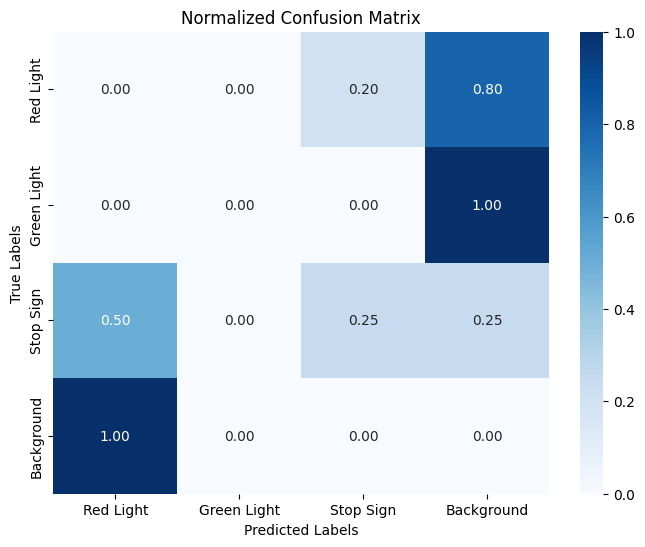

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
              precision    recall  f1-score   support

   Red Light       0.00      0.00      0.00         5
 Green Light       0.00      0.00      0.00         3
   Stop Sign       0.50      0.25      0.33         4
  Background       0.00      0.00      0.00         2

    accuracy                           0.07        14
   macro avg       0.12      0.06      0.08        14
weighted avg       0.14      0.07      0.10        14



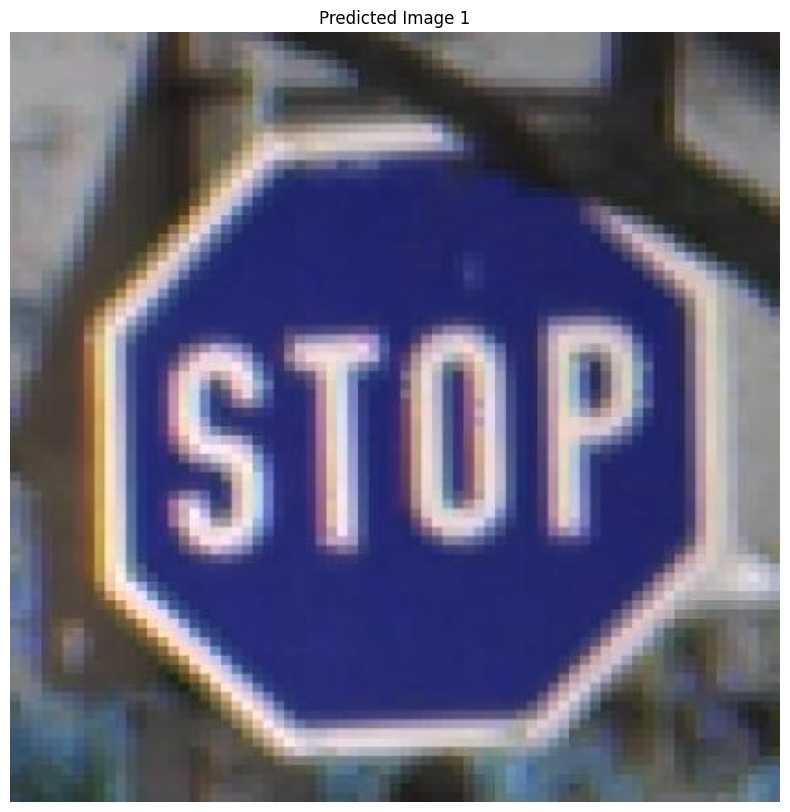

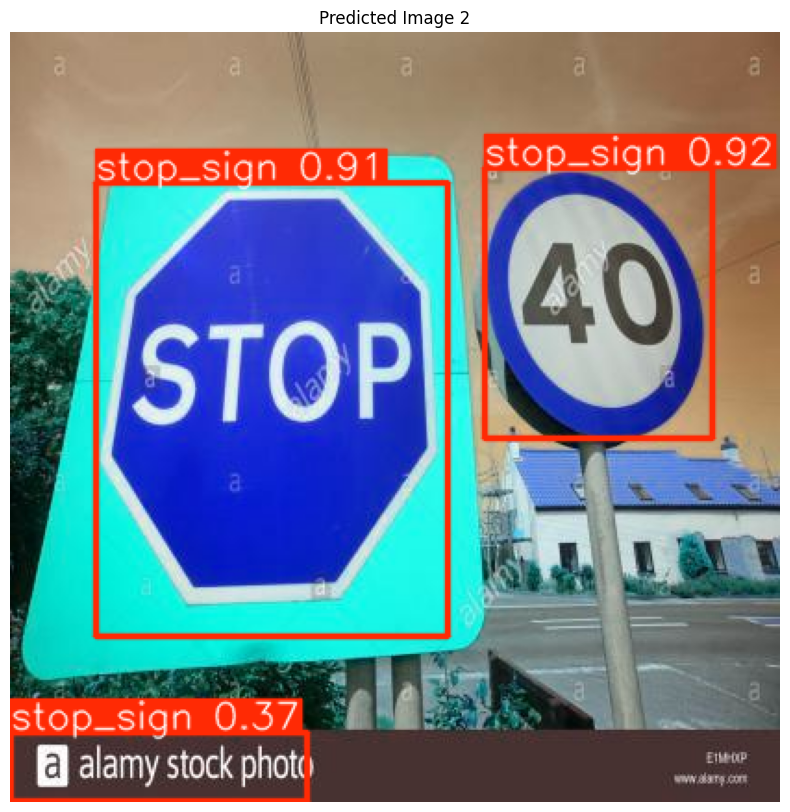

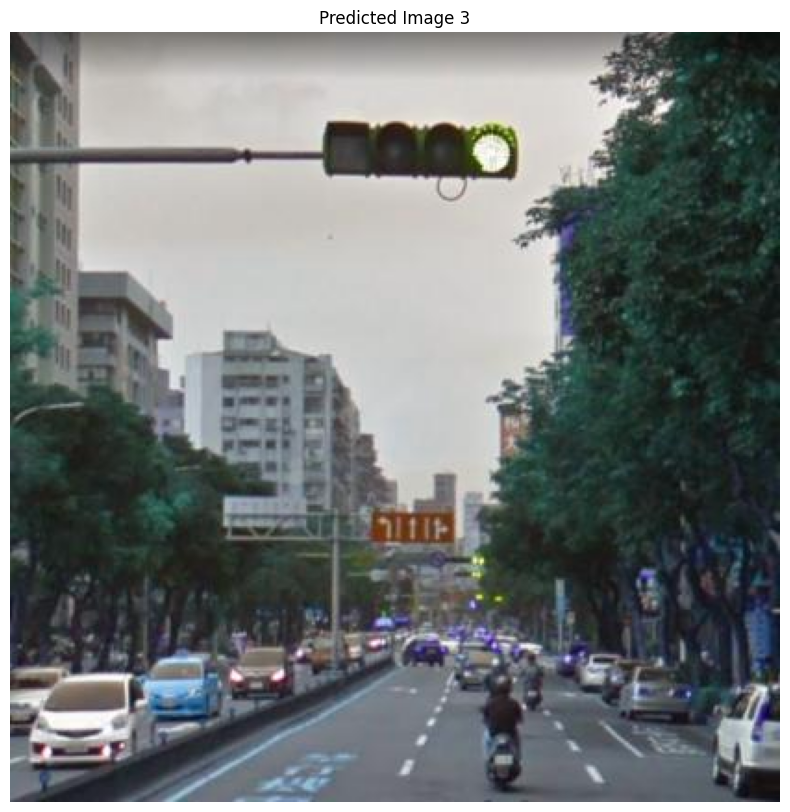

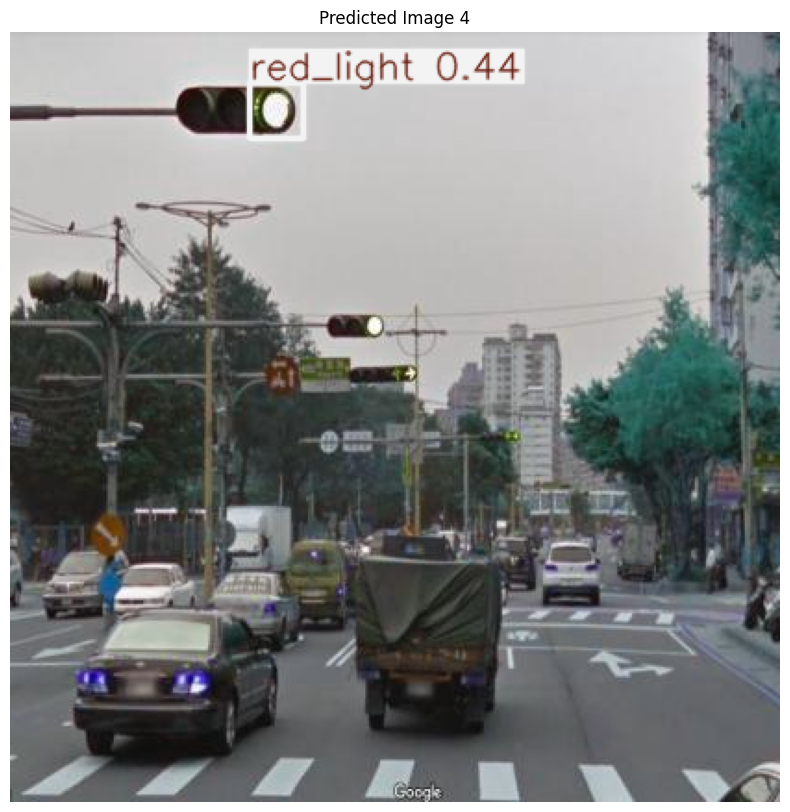

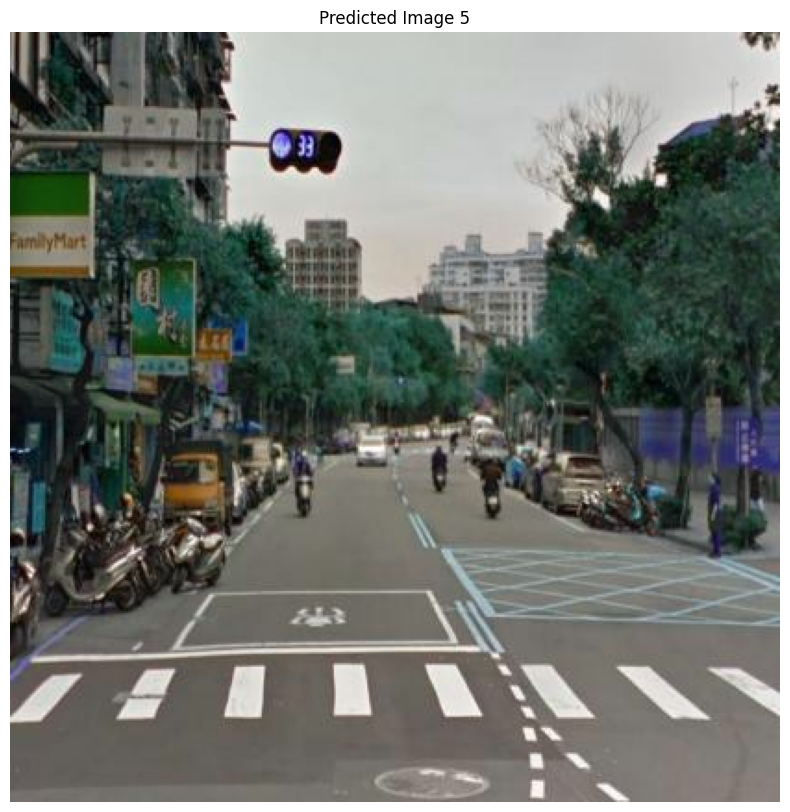

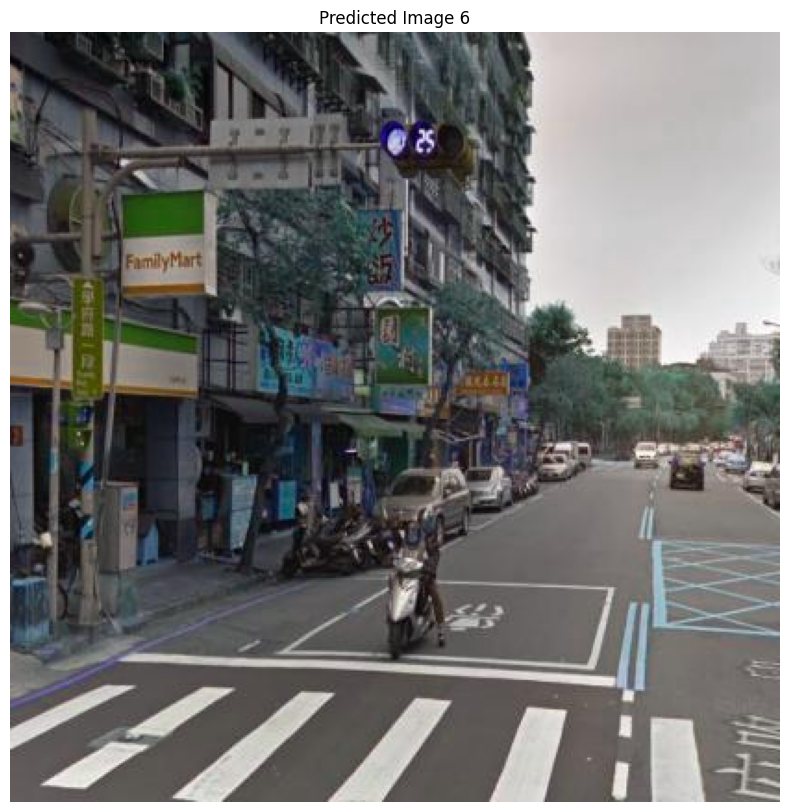

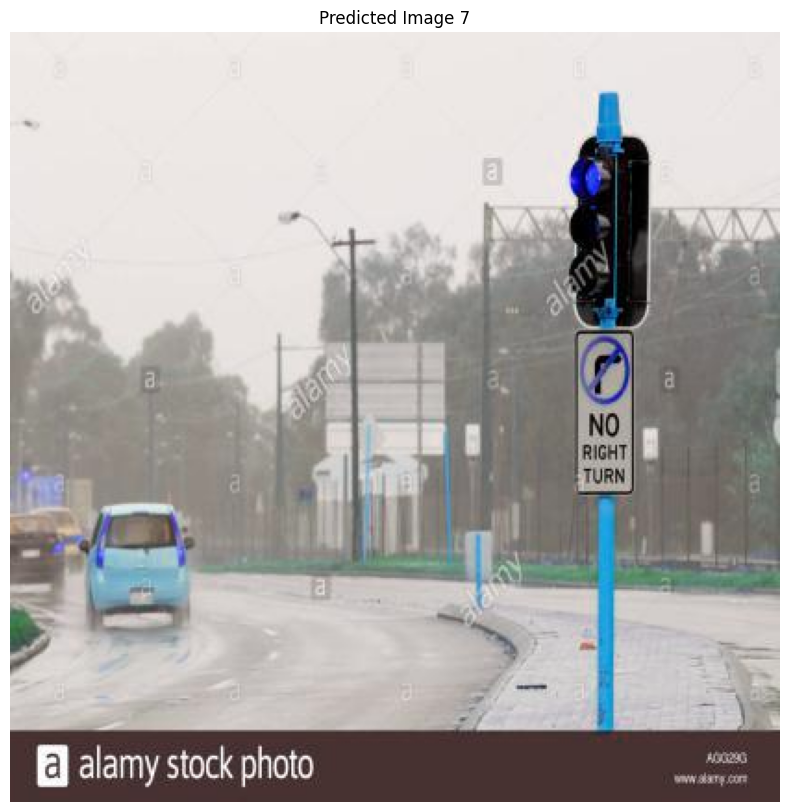

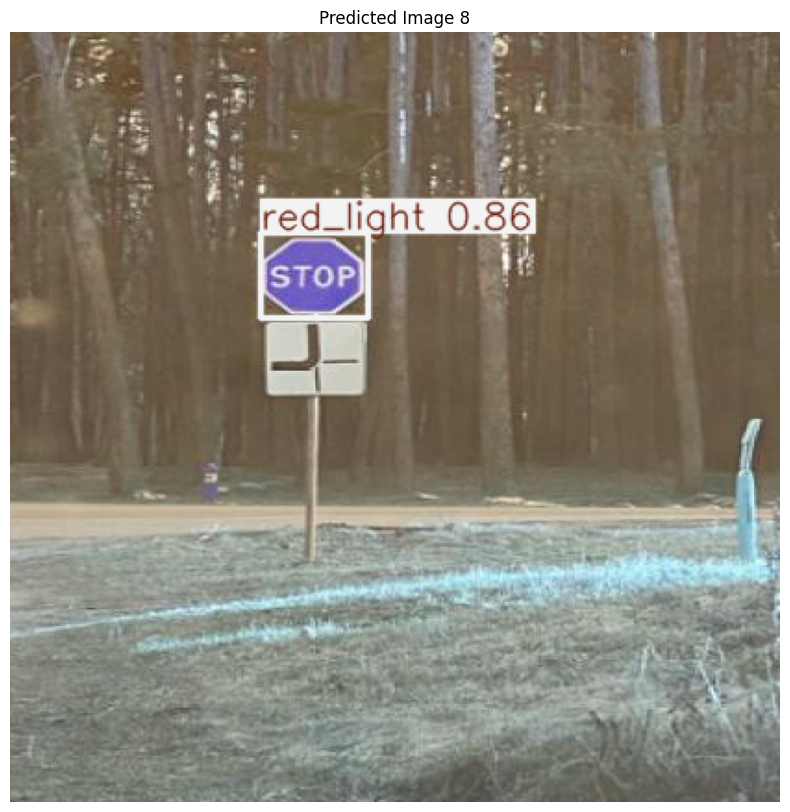

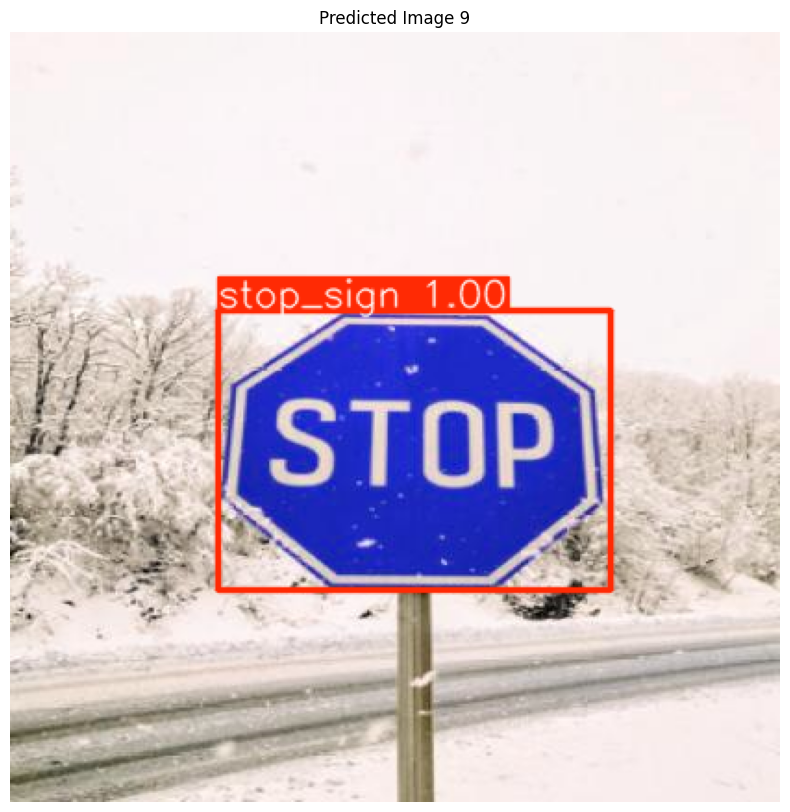

In [27]:
from ultralytics import YOLO
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Load the trained model
model = YOLO("/content/drive/MyDrive/yolo_results_traffic_signs/traffic_sign_detection/weights/best.pt")

# Paths
test_images_folder = "/content/drive/MyDrive/test_images_traffic_signs"
test_labels_folder = "/content/drive/MyDrive/processed_kaggle_traffic_labels"

# Get test images
test_images = sorted([f for f in os.listdir(test_images_folder) if f.endswith(".jpg")])
test_labels = {
    f.replace(".jpg", ".txt"): os.path.join(test_labels_folder, f.replace(".jpg", ".txt"))
    for f in test_images
}

# Prepare ground-truth and predictions
ground_truth = []
predictions = []
image_results = []

# Perform inference on all test images
results = model.predict(
    source=test_images_folder,
    imgsz=640,
    conf=0.25,
    save=False  # Do not save results
)

for i, (image_file, result) in enumerate(zip(test_images, results)):
    # Load ground-truth labels
    label_file = test_labels.get(image_file.replace(".jpg", ".txt"))
    gt_classes = []
    if label_file and os.path.exists(label_file):
        with open(label_file, "r") as f:
            gt_classes = [int(line.split()[0]) for line in f.readlines()]
    else:
        gt_classes = [-1]  # Background class for missing labels

    # Extract predicted classes
    pred_classes = [int(pred.cls) for pred in result.boxes] if result.boxes is not None else [-1]

    # Align predictions with ground-truth labels
    max_len = max(len(gt_classes), len(pred_classes))
    gt_classes.extend([-1] * (max_len - len(gt_classes)))  # Add background for missing GT
    pred_classes.extend([-1] * (max_len - len(pred_classes)))  # Add background for missing predictions

    ground_truth.extend(gt_classes)
    predictions.extend(pred_classes)

    # Store results for this image
    image_results.append({
        "image": image_file,
        "ground_truth": gt_classes,
        "predictions": pred_classes
    })

# Compute confusion matrix
conf_matrix = confusion_matrix(ground_truth, predictions, labels=[0, 1, 2, -1])

# Normalize confusion matrix
normalized_conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(normalized_conf_matrix)

# Plot normalized confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(normalized_conf_matrix, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=["Red Light", "Green Light", "Stop Sign", "Background"],
            yticklabels=["Red Light", "Green Light", "Stop Sign", "Background"])
plt.title("Normalized Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification report
class_report = classification_report(
    ground_truth,
    predictions,
    labels=[0, 1, 2, -1],
    target_names=["Red Light", "Green Light", "Stop Sign", "Background"]
)
print("Classification Report:")
print(class_report)

# Display up to 10 predicted images with annotations
for i, result in enumerate(results[:10]):  # Limit to 10 images
    pred_image = result.plot()  # Convert the predicted result to an image with annotations
    plt.figure(figsize=(10, 10))
    plt.imshow(pred_image)
    plt.axis('off')
    plt.title(f"Predicted Image {i + 1}")
    plt.show()


# I trained the yolov8n.pt pretrained model using the kaggle dataset balloon images (real images)

In [2]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define paths
image_folder = "/content/drive/MyDrive/processed_kaggle_traffic_train_images"
annotation_folder = "/content/drive/MyDrive/processed_kaggle_traffic_labels"
dataset_path = "/content/drive/MyDrive/yolo_dataset_processed_traffic_signs"
os.makedirs(dataset_path, exist_ok=True)

# YOLO dataset structure
images_train = os.path.join(dataset_path, "images/train")
images_val = os.path.join(dataset_path, "images/val")
labels_train = os.path.join(dataset_path, "labels/train")
labels_val = os.path.join(dataset_path, "labels/val")

for folder in [images_train, images_val, labels_train, labels_val]:
    os.makedirs(folder, exist_ok=True)

# Gather all images and annotations
images = sorted([f for f in os.listdir(image_folder) if f.endswith(".jpg")])  # Assuming images are .jpg
annotations = sorted([f for f in os.listdir(annotation_folder) if f.endswith(".txt")])

# Ensure image-annotation pair alignment
assert len(images) == len(annotations), "Mismatch between images and annotation files!"

# Split into train and validation sets
train_images, val_images = train_test_split(images, test_size=0.2, random_state=42)

# Helper to move files to YOLO structure
def move_files(images, split_folder, label_folder):
    for image_file in images:
        # Copy image
        shutil.copy(
            os.path.join(image_folder, image_file),
            os.path.join(split_folder, image_file)
        )

        # Corresponding annotation
        annotation_file = image_file.replace(".jpg", ".txt")  # Match the image extension
        shutil.copy(
            os.path.join(annotation_folder, annotation_file),
            os.path.join(label_folder, annotation_file)
        )

# Organize training and validation data
move_files(train_images, images_train, labels_train)
move_files(val_images, images_val, labels_val)

# Write the data.yaml file
data_yaml = os.path.join(dataset_path, "data.yaml")
with open(data_yaml, "w") as f:
    f.write(f"""
train: {images_train}
val: {images_val}

nc: 3  # Number of classes
names: ['class_0', 'class_1', 'class_2']  # Class names
""")
print(f"`data.yaml` created at: {data_yaml}")

# Install YOLO (Ultralytics library)
!pip install ultralytics

# Import YOLO library and train
from ultralytics import YOLO

# Load the model
model = YOLO("yolov8n.pt")  # Use YOLOv8 nano for speed and efficiency

# Train the model
model.train(
    data=data_yaml,
    epochs=50,  # Increase epochs for better training
    batch=8,    # Adjust batch size as needed
    imgsz=640,  # Image size
    project="/content/drive/MyDrive/yolo_results_processed_traffic_signs",  # Save results here
    name="processed_traffic_sign_detection",
    augment=True  # Enable data augmentation
)

# Evaluate the model
results = model.val()
print("Validation Results:")
print(results)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
`data.yaml` created at: /content/drive/MyDrive/yolo_dataset_processed_traffic_signs/data.yaml
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/yolo_dataset_processed_traffic_signs/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_results_processed_traffic_signs, name=processed_traffic_sign_detection2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybri

train: Scanning /content/drive/MyDrive/yolo_dataset_processed_traffic_signs/labels/train.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/yolo_dataset_processed_traffic_signs/labels/val.cache... 38 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38/38 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.37G      1.391      4.085      1.471          4        640: 100%|██████████| 19/19 [00:07<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all         38         58    0.00245      0.459      0.176     0.0848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.28G       1.25       3.09      1.307          9        640: 100%|██████████| 19/19 [00:03<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.97it/s]

                   all         38         58    0.00399        0.5      0.171      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.31G      1.277      2.877      1.411          7        640: 100%|██████████| 19/19 [00:03<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         38         58    0.00246      0.524       0.26       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.31G      1.336      2.935      1.364          6        640: 100%|██████████| 19/19 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]

                   all         38         58      0.891      0.222      0.274      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.31G      1.228      2.816      1.331          9        640: 100%|██████████| 19/19 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.33it/s]

                   all         38         58      0.876      0.222      0.282      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.32G      1.289      2.662      1.327         11        640: 100%|██████████| 19/19 [00:03<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.40it/s]

                   all         38         58      0.374      0.318      0.402      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.31G       1.29      2.686      1.312          5        640: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.10it/s]

                   all         38         58      0.268      0.566      0.381      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.32G      1.224      2.403      1.289         11        640: 100%|██████████| 19/19 [00:03<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.22it/s]

                   all         38         58      0.363      0.481      0.372      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.32G      1.134      2.299      1.229          8        640: 100%|██████████| 19/19 [00:03<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.68it/s]

                   all         38         58      0.485      0.414      0.411      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.32G      1.224      2.361      1.357         12        640: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.98it/s]

                   all         38         58      0.379      0.529      0.456      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.31G      1.132      2.289       1.31          5        640: 100%|██████████| 19/19 [00:05<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.46it/s]

                   all         38         58      0.486      0.481      0.373      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.31G      1.232      2.304      1.291         14        640: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]


                   all         38         58       0.51      0.435      0.431       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.32G      1.184      2.074      1.265         14        640: 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.28it/s]

                   all         38         58      0.451      0.511      0.473       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.31G      1.117      2.078      1.308         10        640: 100%|██████████| 19/19 [00:06<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.16it/s]

                   all         38         58      0.719      0.421      0.524      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.31G      1.196      2.021      1.272         10        640: 100%|██████████| 19/19 [00:03<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.95it/s]

                   all         38         58      0.715      0.431       0.53      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.31G      1.212      1.971      1.319          7        640: 100%|██████████| 19/19 [00:03<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.52it/s]

                   all         38         58      0.499      0.431      0.461      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.31G      1.103      1.896      1.234          7        640: 100%|██████████| 19/19 [00:06<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         38         58      0.757      0.433      0.547      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.32G      1.056      1.755      1.217          9        640: 100%|██████████| 19/19 [00:03<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.56it/s]

                   all         38         58      0.642      0.503      0.545      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.31G      1.106      1.672      1.221          5        640: 100%|██████████| 19/19 [00:03<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.26it/s]

                   all         38         58      0.531      0.579       0.56      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.31G      1.075      1.577      1.217          8        640: 100%|██████████| 19/19 [00:05<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         38         58      0.742      0.561      0.599      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.31G      1.111      1.602      1.291         12        640: 100%|██████████| 19/19 [00:03<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.09it/s]

                   all         38         58      0.599      0.618      0.628      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.32G      1.083       1.54       1.18          9        640: 100%|██████████| 19/19 [00:03<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.93it/s]

                   all         38         58      0.506      0.636       0.58      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.31G      1.083      1.644      1.232          8        640: 100%|██████████| 19/19 [00:04<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.70it/s]


                   all         38         58      0.542       0.72      0.634      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.31G      1.103      1.555      1.223          8        640: 100%|██████████| 19/19 [00:05<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         38         58      0.618      0.622      0.646      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.32G      1.115      1.501        1.2         11        640: 100%|██████████| 19/19 [00:03<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.42it/s]

                   all         38         58      0.716      0.676      0.682      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.31G     0.9896      1.419      1.179         11        640: 100%|██████████| 19/19 [00:03<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]

                   all         38         58      0.585       0.67      0.632      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.31G     0.9709      1.485      1.183          7        640: 100%|██████████| 19/19 [00:05<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


                   all         38         58      0.771      0.561      0.638      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       1.3G     0.9632      1.299      1.134         19        640: 100%|██████████| 19/19 [00:03<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.91it/s]

                   all         38         58      0.749      0.618      0.651      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.31G     0.9553      1.338      1.159         12        640: 100%|██████████| 19/19 [00:03<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.65it/s]

                   all         38         58      0.802      0.553      0.654      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.31G     0.9742      1.317      1.181          7        640: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.00it/s]

                   all         38         58      0.783      0.647      0.669      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.31G     0.8809      1.191      1.123         10        640: 100%|██████████| 19/19 [00:05<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.87it/s]

                   all         38         58      0.795      0.552      0.649      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.32G     0.9072      1.255      1.079         12        640: 100%|██████████| 19/19 [00:03<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.76it/s]

                   all         38         58      0.646      0.635      0.659       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.31G     0.9663      1.281      1.124          8        640: 100%|██████████| 19/19 [00:03<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]


                   all         38         58      0.717      0.632      0.675      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.31G      0.887        1.2      1.129          8        640: 100%|██████████| 19/19 [00:05<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         38         58      0.726      0.683      0.681      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.31G     0.9458      1.216      1.138         10        640: 100%|██████████| 19/19 [00:03<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.98it/s]

                   all         38         58      0.753      0.682      0.699      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       1.3G     0.9781      1.199      1.133          7        640: 100%|██████████| 19/19 [00:03<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.49it/s]

                   all         38         58      0.795      0.693      0.709      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.31G     0.9004      1.137      1.079         11        640: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]

                   all         38         58      0.769      0.684      0.711      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.32G     0.8444      1.079      1.093         11        640: 100%|██████████| 19/19 [00:04<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.90it/s]

                   all         38         58       0.71      0.701      0.711      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.31G     0.8454      1.089      1.083          8        640: 100%|██████████| 19/19 [00:03<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.70it/s]

                   all         38         58       0.86      0.644      0.716      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.31G     0.9094      1.128      1.096          5        640: 100%|██████████| 19/19 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.89it/s]

                   all         38         58      0.862      0.637      0.724      0.513


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.31G     0.9917      1.352       1.12          7        640: 100%|██████████| 19/19 [00:07<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.28it/s]

                   all         38         58      0.854      0.647        0.7      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.31G     0.8697      1.204      1.035          5        640: 100%|██████████| 19/19 [00:03<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.82it/s]

                   all         38         58      0.797      0.697      0.706      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.31G     0.8718      1.217      1.007          7        640: 100%|██████████| 19/19 [00:03<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.35it/s]

                   all         38         58      0.804      0.711      0.724      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       1.3G     0.8466      1.238      1.048          5        640: 100%|██████████| 19/19 [00:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all         38         58      0.786      0.726      0.729      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.31G     0.9033      1.169      1.079          4        640: 100%|██████████| 19/19 [00:03<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.16it/s]

                   all         38         58      0.775      0.717      0.733      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.31G     0.8453      1.159      1.052          4        640: 100%|██████████| 19/19 [00:03<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.75it/s]

                   all         38         58      0.772      0.708       0.73      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.31G      0.864      1.106      1.029          7        640: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.30it/s]

                   all         38         58      0.839      0.684      0.737      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.31G     0.8778      1.138      1.037          6        640: 100%|██████████| 19/19 [00:05<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.26it/s]

                   all         38         58      0.845      0.662      0.737      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.31G     0.8582      1.253      1.027          6        640: 100%|██████████| 19/19 [00:03<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.41it/s]

                   all         38         58      0.782      0.698      0.734      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.31G     0.8284      1.049      1.008          6        640: 100%|██████████| 19/19 [00:03<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.54it/s]


                   all         38         58      0.793      0.696      0.736      0.539

50 epochs completed in 0.083 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.15it/s]


                   all         38         58      0.886      0.663       0.76      0.552
               class_0         18         28      0.867      0.571      0.776       0.44
               class_1         12         18       0.86        0.5      0.515      0.334
               class_2         12         12       0.93      0.917      0.989       0.88
Speed: 0.5ms preprocess, 53.3ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/yolo_dataset_processed_traffic_signs/labels/val.cache... 38 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]


                   all         38         58      0.885      0.663      0.759       0.55
               class_0         18         28      0.865      0.571      0.776      0.438
               class_1         12         18      0.861        0.5      0.512       0.33
               class_2         12         12       0.93      0.917      0.989       0.88
Speed: 2.7ms preprocess, 26.9ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection22
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f6a2b7772e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.0050

#testing the model with the best weights on the same set of images taken from the kaggle dataset of balloons which were not used in training the model.


image 1/1 /content/drive/MyDrive/test_images_traffic_signs/00014_00010_00014_png.rf.3f9712dbd32c574c45bf9dbb8517dd9f.jpg: 640x640 1 class_2, 20.3ms
Speed: 3.4ms preprocess, 20.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/test_images_traffic_signs/000287_jpg.rf.a4143ed52df9779f0f27104daf6a8762.jpg: 640x640 1 class_2, 30.5ms
Speed: 3.6ms preprocess, 30.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/test_images_traffic_signs/000922_JPG_jpg.rf.143f5b1a97d934ec4a71114055fa5a0b.jpg: 640x640 1 class_0, 32.6ms
Speed: 11.3ms preprocess, 32.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/test_images_traffic_signs/000944_JPG_jpg.rf.a0b81118199b4d11ccb859c15d0cb1f6.jpg: 640x640 3 class_0s, 25.1ms
Speed: 3.8ms preprocess, 25.1ms inference, 5.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/test_

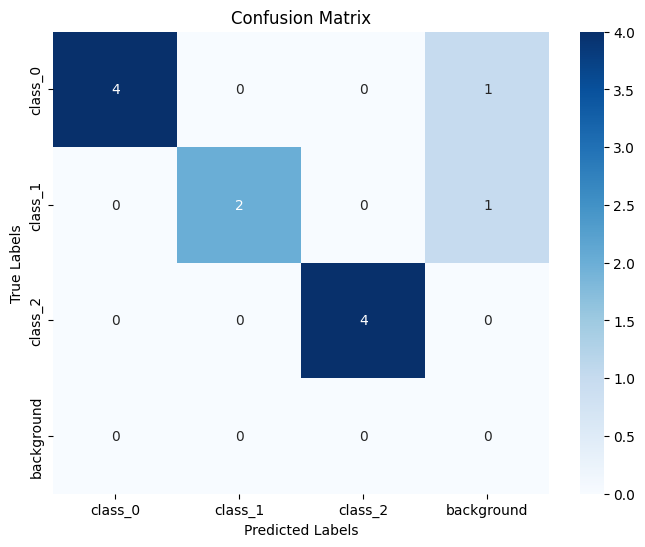

Classification Report:
              precision    recall  f1-score   support

     class_0       1.00      0.80      0.89         5
     class_1       1.00      0.67      0.80         3
     class_2       1.00      1.00      1.00         4
  background       0.00      0.00      0.00         0

    accuracy                           0.83        12
   macro avg       0.75      0.62      0.67        12
weighted avg       1.00      0.83      0.90        12


Displaying 10 Predicted Images:

image 1/9 /content/drive/MyDrive/test_images_traffic_signs/00014_00010_00014_png.rf.3f9712dbd32c574c45bf9dbb8517dd9f.jpg: 640x640 1 class_2, 24.7ms
image 2/9 /content/drive/MyDrive/test_images_traffic_signs/000287_jpg.rf.a4143ed52df9779f0f27104daf6a8762.jpg: 640x640 1 class_2, 12.2ms
image 3/9 /content/drive/MyDrive/test_images_traffic_signs/000922_JPG_jpg.rf.143f5b1a97d934ec4a71114055fa5a0b.jpg: 640x640 1 class_0, 14.6ms


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


image 4/9 /content/drive/MyDrive/test_images_traffic_signs/000944_JPG_jpg.rf.a0b81118199b4d11ccb859c15d0cb1f6.jpg: 640x640 3 class_0s, 24.5ms
image 5/9 /content/drive/MyDrive/test_images_traffic_signs/001607_JPG_jpg.rf.a6dcbc5ecd7c2ef807a4bce512a054a0.jpg: 640x640 1 class_1, 16.7ms
image 6/9 /content/drive/MyDrive/test_images_traffic_signs/001624_JPG_jpg.rf.a3a7ed1ca4bdc41789b882fe5d7e3e94.jpg: 640x640 1 class_1, 13.8ms
image 7/9 /content/drive/MyDrive/test_images_traffic_signs/001982_jpg.rf.6d24adf886f0c39c03910738d4ecc170.jpg: 640x640 (no detections), 9.8ms
image 8/9 /content/drive/MyDrive/test_images_traffic_signs/road633_png.rf.282d128c502ba602126742a5064cd054.jpg: 640x640 1 class_2, 7.7ms
image 9/9 /content/drive/MyDrive/test_images_traffic_signs/road85_png.rf.86fab2367257fba23a95cad102a7dd82.jpg: 640x640 1 class_2, 19.0ms
Speed: 4.5ms preprocess, 15.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


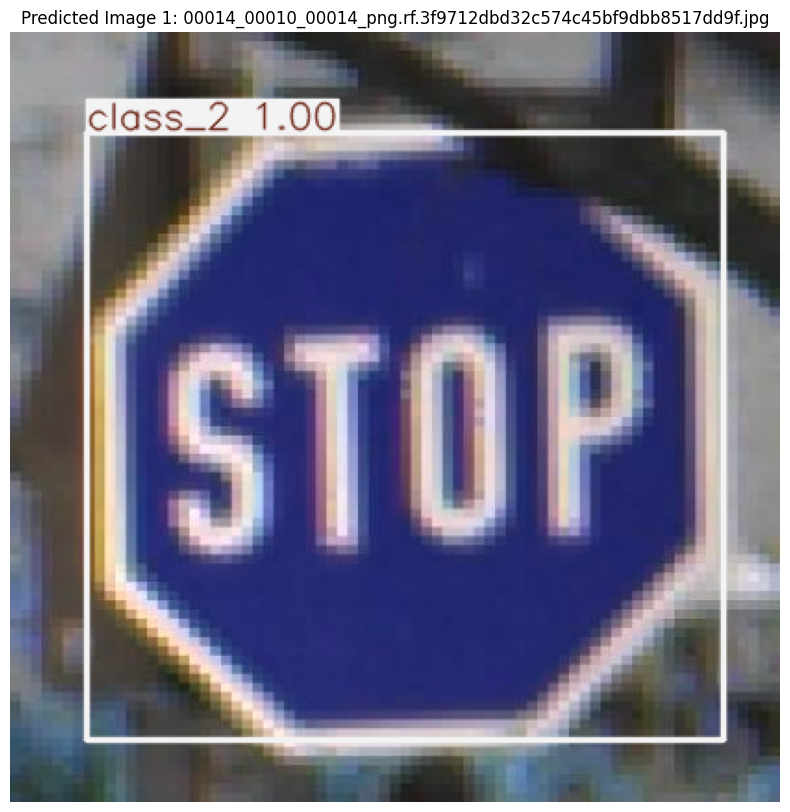

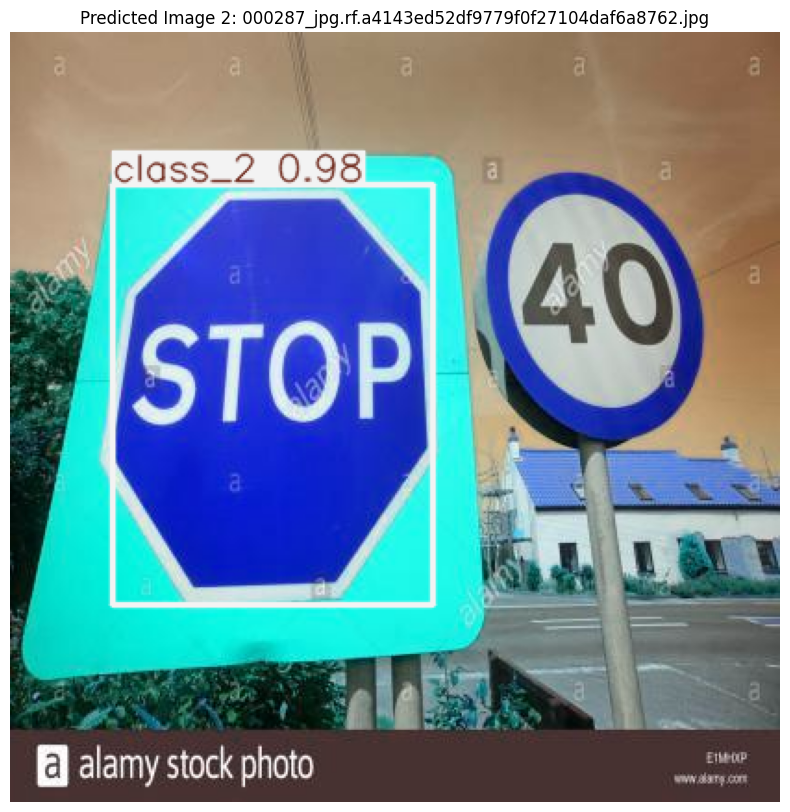

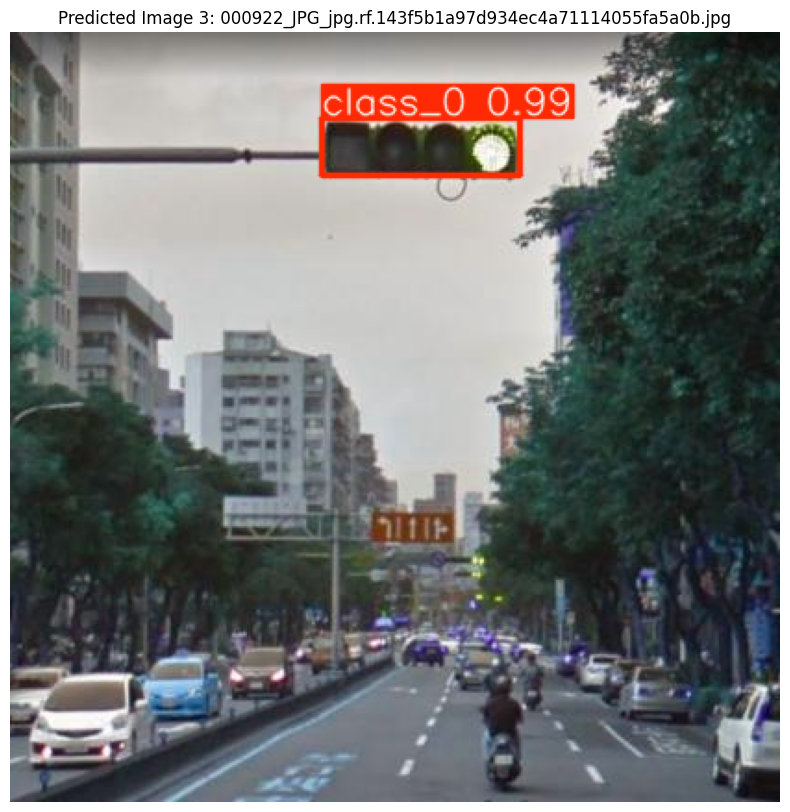

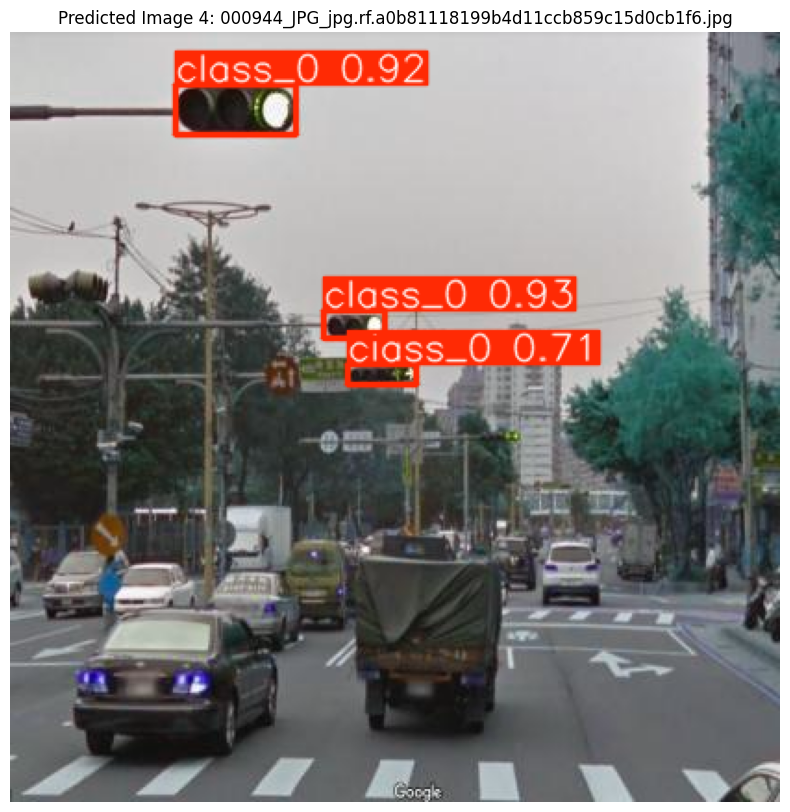

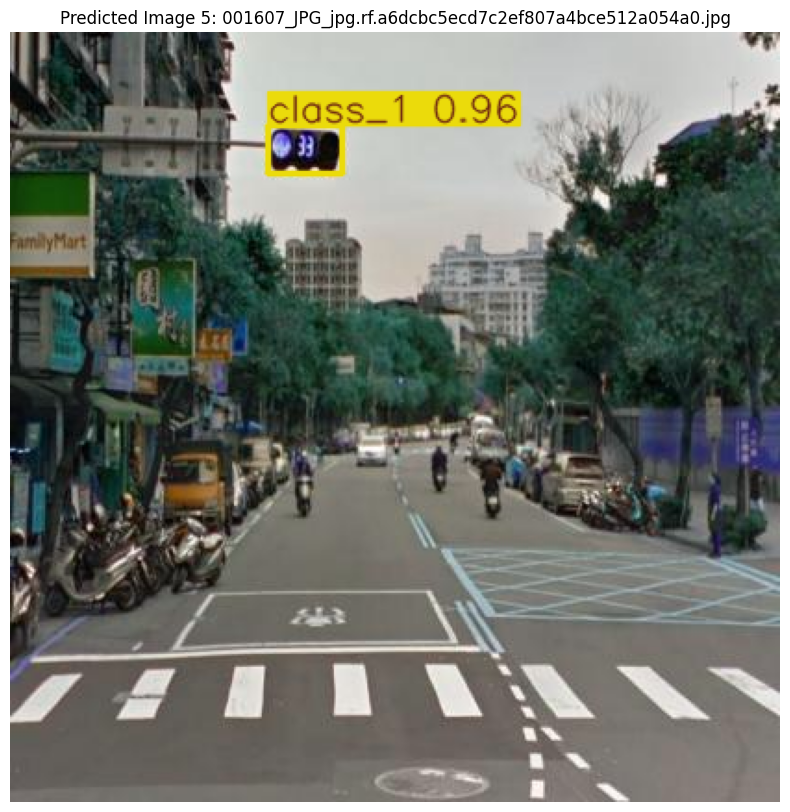

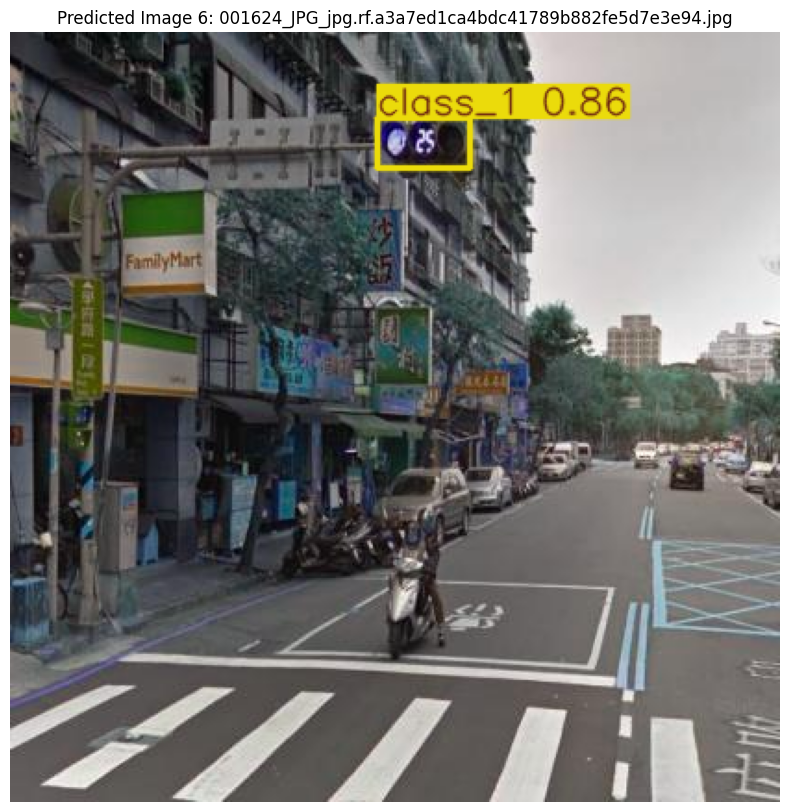

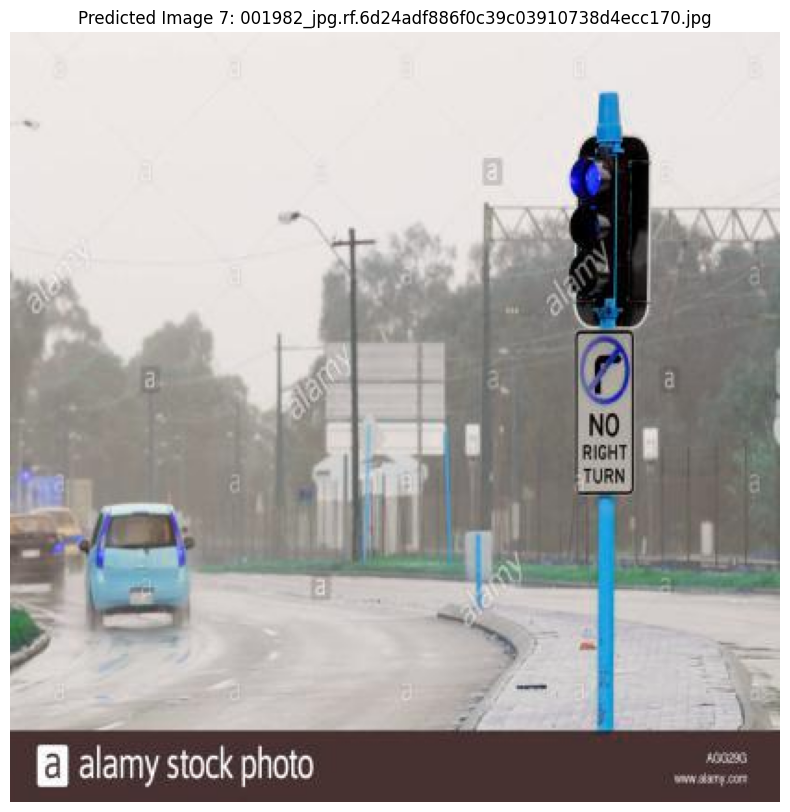

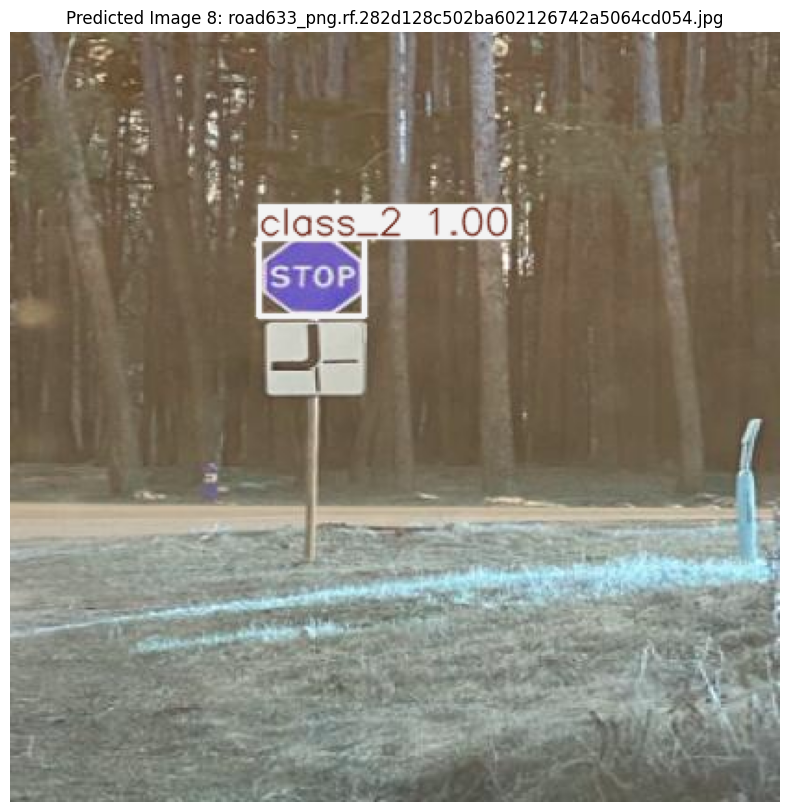

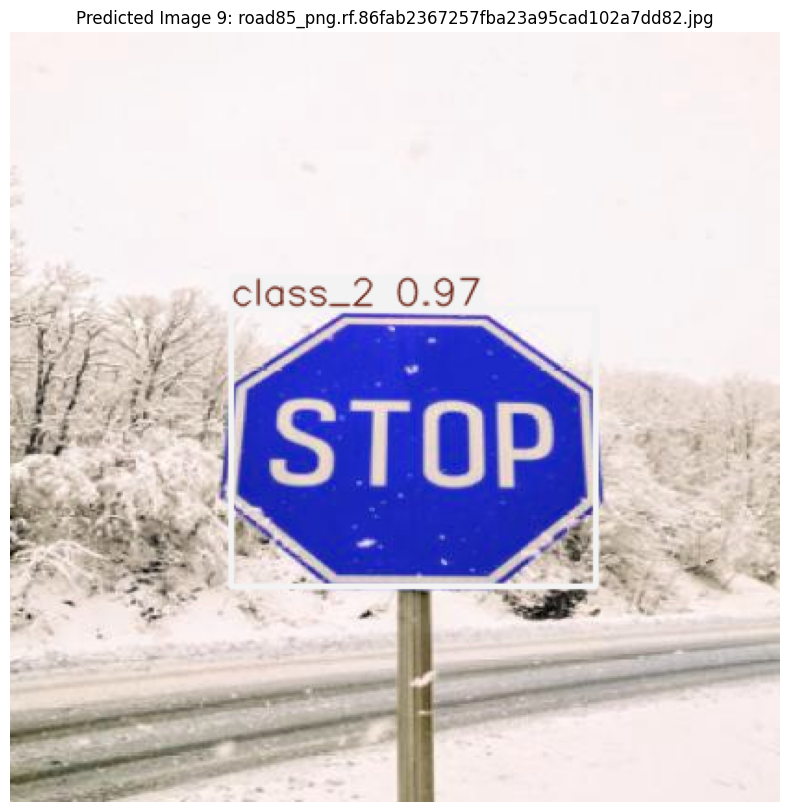

In [24]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from ultralytics import YOLO

# Paths
test_images_folder = "/content/drive/MyDrive/test_images_traffic_signs"
test_labels_folder = "/content/drive/MyDrive/processed_kaggle_traffic_labels"

# Load YOLO model
model = YOLO("/content/drive/MyDrive/yolo_results_processed_traffic_signs/processed_traffic_sign_detection2/weights/best.pt")

# Get test images and corresponding labels
test_images = sorted([f for f in os.listdir(test_images_folder) if f.endswith(".jpg")])
test_labels = {
    f.replace(".jpg", ".txt"): os.path.join(test_labels_folder, f.replace(".jpg", ".txt"))
    for f in test_images
}

# Prepare ground-truth and predictions
ground_truth = []
predictions = []
image_results = []  # To track image, GT, and predictions

# Perform inference and collect results
for image_file in test_images:
    image_path = os.path.join(test_images_folder, image_file)
    label_file = test_labels.get(image_file.replace(".jpg", ".txt"))

    # Load ground-truth labels
    gt_classes = []
    if label_file and os.path.exists(label_file):
        with open(label_file, "r") as f:
            gt_classes = [int(line.split()[0]) for line in f.readlines()]
    else:
        gt_classes = [-1]  # Background class for images without labels

    # Predict using YOLO model
    results = model.predict(image_path, save=False, conf=0.5)  # Disable saving files
    pred_classes = [int(pred.cls) for pred in results[0].boxes] if results[0].boxes is not None else [-1]

    # Align predictions with ground-truth labels
    max_len = max(len(gt_classes), len(pred_classes))
    gt_classes.extend([-1] * (max_len - len(gt_classes)))  # Add background for missing GT
    pred_classes.extend([-1] * (max_len - len(pred_classes)))  # Add background for missing predictions

    ground_truth.extend(gt_classes)
    predictions.extend(pred_classes)

    # Store results for this image
    image_results.append({
        "image": image_file,
        "ground_truth": gt_classes,
        "predictions": pred_classes
    })

# Compute confusion matrix
conf_matrix = confusion_matrix(ground_truth, predictions, labels=[0, 1, 2, -1])
print("Confusion Matrix:")
print(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["class_0", "class_1", "class_2", "background"], yticklabels=["class_0", "class_1", "class_2", "background"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Classification report
class_report = classification_report(ground_truth, predictions, labels=[0, 1, 2, -1], target_names=["class_0", "class_1", "class_2", "background"])
print("Classification Report:")
print(class_report)

# Display up to 10 predicted images
print("\nDisplaying 10 Predicted Images:")
for i, (image_file, result) in enumerate(zip(test_images, model.predict(test_images_folder, save=False, conf=0.5))):
    if i >= 10:  # Limit to 10 images
        break
    pred_image = result.plot()  # Generate annotated image
    plt.figure(figsize=(10, 10))
    plt.imshow(pred_image)
    plt.axis('off')
    plt.title(f"Predicted Image {i + 1}: {image_file}")
    plt.show()


# the model which was trained with real images (kaggle dataset) gave very better and close perfect predictions compared to the model trained with generative-ai generated images.